<a href="https://colab.research.google.com/github/Crazytiger0527/Study_Pytorch/blob/main/deeplabv3%2B_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from pycocotools.coco import COCO
from sklearn.model_selection import train_test_split
import os
import matplotlib.pyplot as plt
from torchvision import transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import random

In [ ]:
dataset_path = '/content/drive/MyDrive/merge/ffdata'
train_path = '/content/drive/MyDrive/merge/annotations/ffdata.json'

In [ ]:
# COCO Dataset Class
class COCO_dataformat(Dataset):
    def __init__(self, data_dir, mode='train', transform=None, image_ids=None):
        super().__init__()
        self.mode = mode
        self.transform = transform
        self.coco = COCO(data_dir)

        self.cat_ids = self.coco.getCatIds(catNms=['person','fighting', 'falling'])  # only get 'fighting' and 'falling'
        self.cats = self.coco.loadCats(self.cat_ids)
        self.classNameList = ['Background']
        for i in range(len(self.cat_ids)):
            self.classNameList.append(self.cats[i]['name'])

        if image_ids is None:
            self.image_ids = self._get_image_ids()  # get all image ids if not provided
        else:
            self.image_ids = image_ids  # use provided image ids

    def _get_image_ids(self):
        image_ids = []
        for cat_id in self.cat_ids:
            image_ids.extend(self.coco.getImgIds(catIds=cat_id))  # get image ids related to 'fighting' and 'falling'
        image_ids = list(set(image_ids))  # remove duplicated ids
        return image_ids


    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        image_infos = self.coco.loadImgs(image_id)[0]

        # Load the image
        images = cv2.imread(os.path.join(dataset_path, image_infos['file_name']))
        images = cv2.cvtColor(images, cv2.COLOR_BGR2RGB).astype(np.float32)
        images /= 255.0  # normalization

        if self.mode in ('train', 'val'):
            ann_ids = self.coco.getAnnIds(imgIds=image_infos['id'])
            anns = self.coco.loadAnns(ann_ids)

            # Create masks for specific categories
            masks = np.zeros((image_infos["height"], image_infos["width"]))
            anns = sorted(anns, key=lambda idx: len(idx['segmentation'][0]), reverse=False)
            for i in range(len(anns)):
                category_name = self.coco.loadCats(anns[i]['category_id'])[0]['name']
                if category_name == 'fighting':
                    masks[self.coco.annToMask(anns[i]) == 1] = 1
                elif category_name == 'falling':
                    masks[self.coco.annToMask(anns[i]) == 1] = 2
                elif category_name == 'person':
                    masks[self.coco.annToMask(anns[i]) == 1] = 3
            masks = masks.astype(np.int8)


            if self.transform is not None:
                transformed = self.transform(image=images, mask=masks)
                images = transformed["image"]
                masks = transformed["mask"]
            return images, masks, image_infos

        if self.mode == 'test':
            if self.transform is not None:
                transformed = self.transform(image=images)
                images = transformed["image"]
            return images, image_infos


    def split_dataset(self, test_size=0.2, random_state=42):
        train_ids, valid_ids = train_test_split(self.image_ids, test_size=test_size, random_state=random_state)
        return train_ids, valid_ids

    def __len__(self):
        return len(self.image_ids)  # return the total number of 'dog' and 'cat' images

In [ ]:
train_transform = A.Compose([
    A.Resize(224, 224),
    A.HorizontalFlip(p=0.5),
    A.OneOf([
        A.MotionBlur(p=0.2),
        A.OpticalDistortion(p=0.3),
    ], p=1),
    ToTensorV2()
])

valid_transform = A.Compose([
    A.Resize(224, 224),
    ToTensorV2()
])

batch_size = 8

def collate_fn(batch):
    images, masks, infos = zip(*batch)
    images = torch.stack(images)
    masks = torch.stack(masks)
    return images, masks, infos

# Create an instance of the dataset to get the image ids
dataset = COCO_dataformat(data_dir=train_path)
train_ids, valid_ids = dataset.split_dataset()

# Create the train and validation datasets
train_dataset = COCO_dataformat(data_dir=train_path, mode='train', transform=train_transform, image_ids=train_ids)
valid_dataset = COCO_dataformat(data_dir=train_path, mode='val', transform=valid_transform, image_ids=valid_ids)

# Create the data loaders
train_loader = torch.utils.data.DataLoader(dataset=train_dataset,
                                           batch_size=batch_size,
                                           shuffle=True,
                                           num_workers=4,
                                           collate_fn=collate_fn)
valid_loader = torch.utils.data.DataLoader(dataset=valid_dataset,
                                           batch_size=batch_size,
                                           shuffle=False,
                                           num_workers=4,
                                           collate_fn=collate_fn)


loading annotations into memory...
Done (t=1.54s)
creating index...
index created!
loading annotations into memory...
Done (t=0.28s)
creating index...
index created!
loading annotations into memory...
Done (t=0.20s)
creating index...
index created!


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
print(len(train_dataset))
print(len(valid_dataset))

804
202


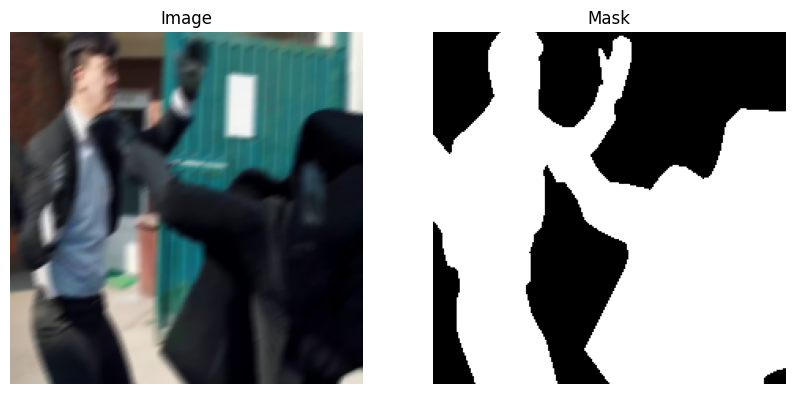

Unique values in mask: [0 1]


In [ ]:
import matplotlib.pyplot as plt

import numpy as np

def visualize_sample(image, mask):
    image = np.transpose(image, (1, 2, 0))  # Transpose image dimensions
    mask = mask.squeeze()  # Remove any single-dimensional entries from the shape of the mask

    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display the image
    ax[0].imshow(image)
    ax[0].axis('off')
    ax[0].set_title('Image')

    # Display the mask
    ax[1].imshow(mask, cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('Mask')

    plt.show()

# Get a sample from the dataset
sample_image, sample_mask, _ = train_dataset[64]

# Visualize the sample
visualize_sample(sample_image, sample_mask)

unique_values = np.unique(sample_mask)
print("Unique values in mask:", unique_values)

In [ ]:
model = torch.hub.load('pytorch/vision:v0.9.0', 'deeplabv3_resnet50', pretrained=True)

Downloading: "https://github.com/pytorch/vision/zipball/v0.9.0" to /root/.cache/torch/hub/v0.9.0.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth
100%|██████████| 161M/161M [00:01<00:00, 88.7MB/s]


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

In [ ]:
def pixel_accuracy(output, mask):
    output = torch.argmax(output, dim=1)
    correct = torch.eq(output, mask).int()
    accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy

def IoU(output, mask):
    output = torch.argmax(output, dim=1)
    intersection = torch.logical_and(mask, output)
    union = torch.logical_or(mask, output)
    iou_score = torch.sum(intersection) / torch.sum(union)
    return iou_score

Epoch [1/50], Step [100/101], Loss: 0.3445, Accuracy: 0.9018, IoU: 0.6467


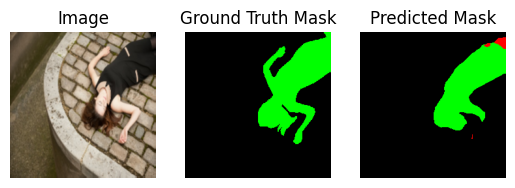

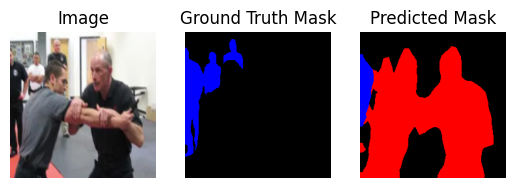

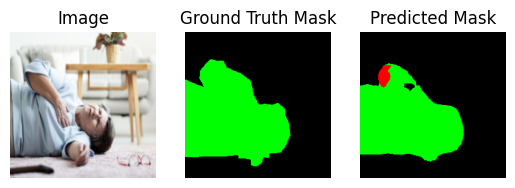

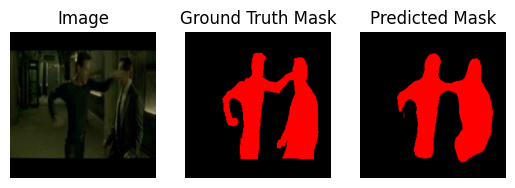

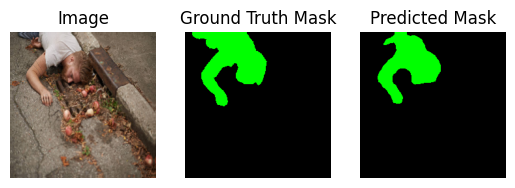

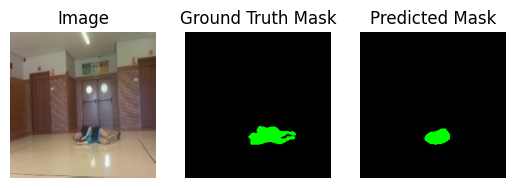

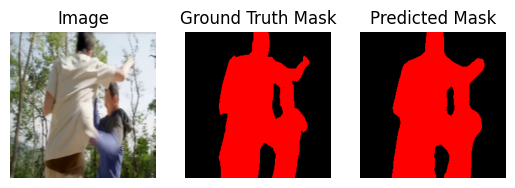

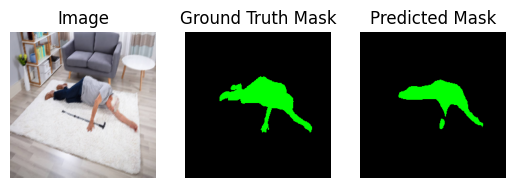

Epoch [1/50], Train Loss: 0.4669, Train Accuracy: 0.8862, Train IoU: 0.7160
Epoch [1/50], Valid Loss: 0.2352, Valid Accuracy: 0.9261, Valid IoU: 0.8109
Epoch [2/50], Step [100/101], Loss: 0.2257, Accuracy: 0.9296, IoU: 0.8536


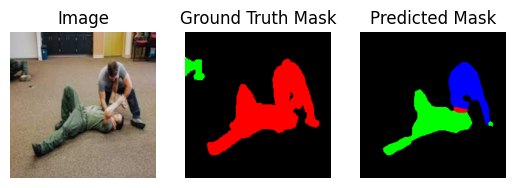

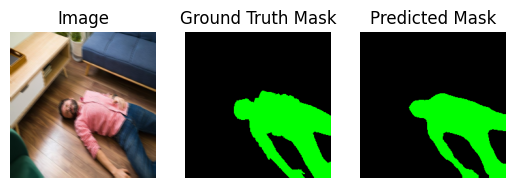

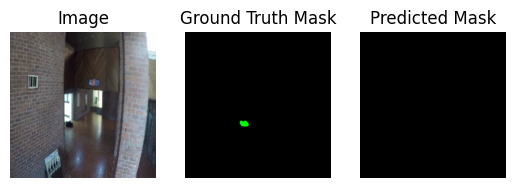

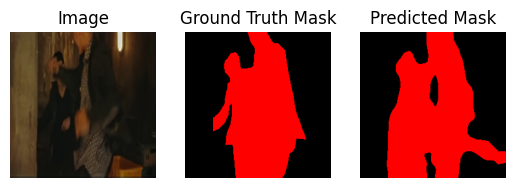

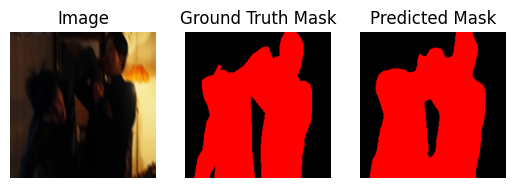

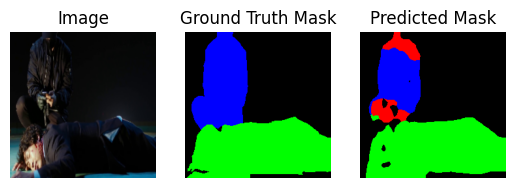

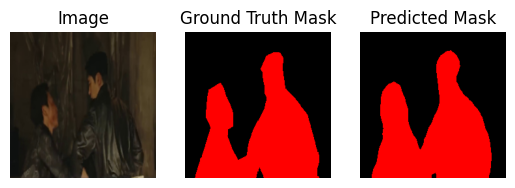

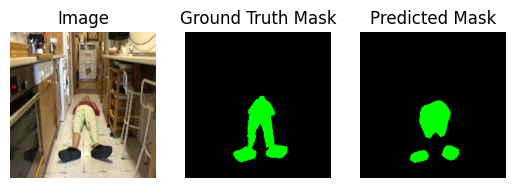

Epoch [2/50], Train Loss: 0.2387, Train Accuracy: 0.9246, Train IoU: 0.8012
Epoch [2/50], Valid Loss: 0.2254, Valid Accuracy: 0.9232, Valid IoU: 0.8232
Epoch [3/50], Step [100/101], Loss: 0.0967, Accuracy: 0.9721, IoU: 0.9063


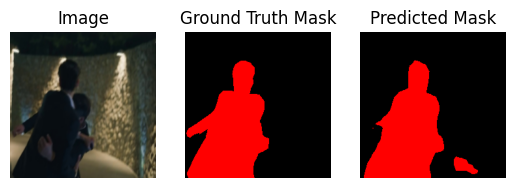

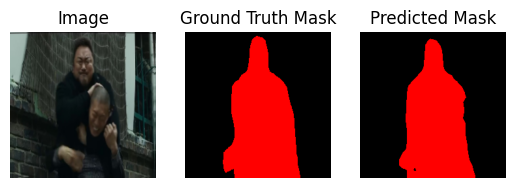

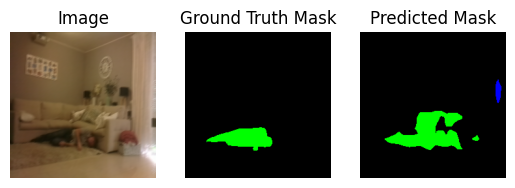

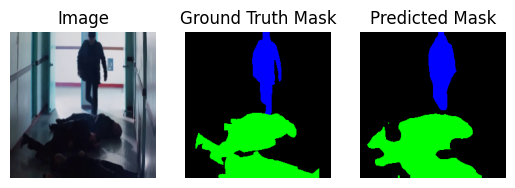

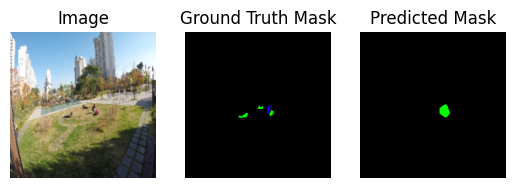

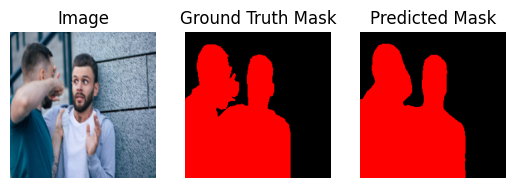

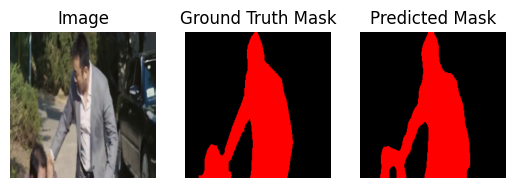

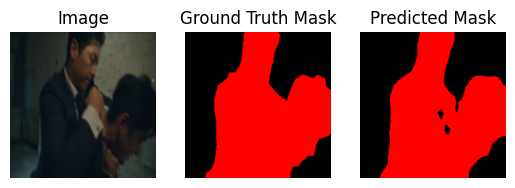

Epoch [3/50], Train Loss: 0.1927, Train Accuracy: 0.9345, Train IoU: 0.8190
Epoch [3/50], Valid Loss: 0.2276, Valid Accuracy: 0.9210, Valid IoU: 0.8337
Epoch [4/50], Step [100/101], Loss: 0.1934, Accuracy: 0.9406, IoU: 0.8775


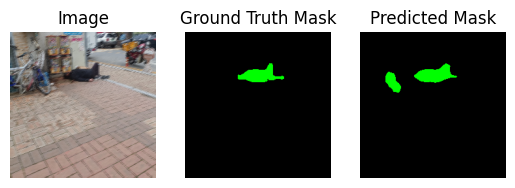

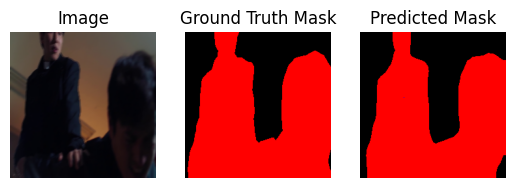

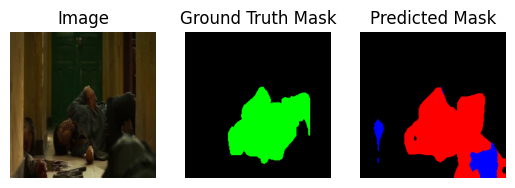

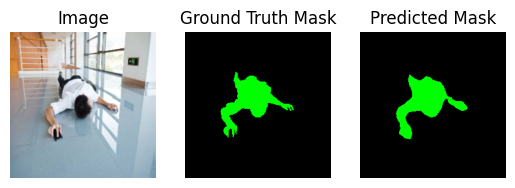

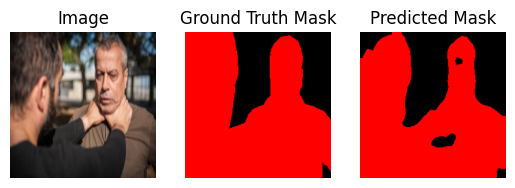

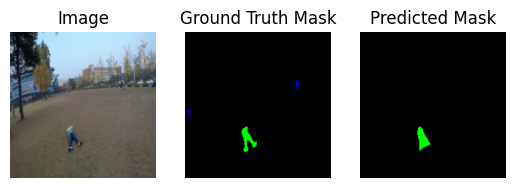

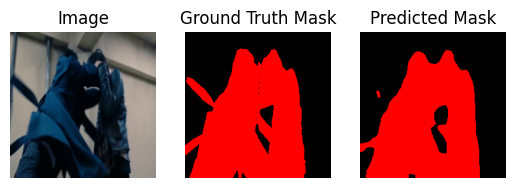

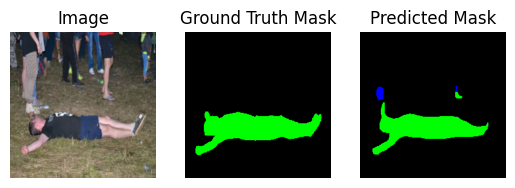

Epoch [4/50], Train Loss: 0.1633, Train Accuracy: 0.9446, Train IoU: 0.8426
Epoch [4/50], Valid Loss: 0.1749, Valid Accuracy: 0.9382, Valid IoU: 0.8513
Epoch [5/50], Step [100/101], Loss: 0.2925, Accuracy: 0.8888, IoU: 0.6047


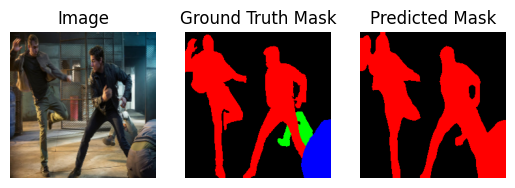

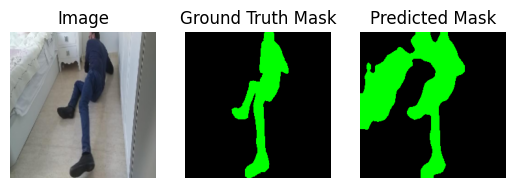

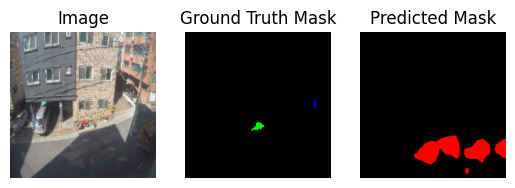

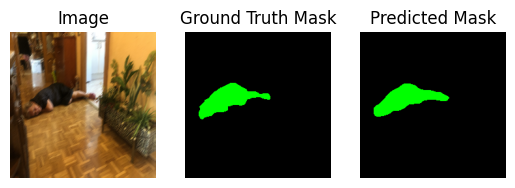

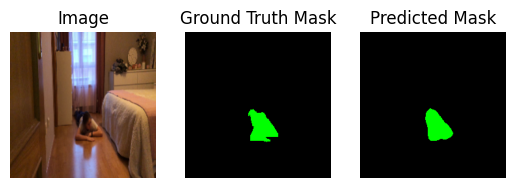

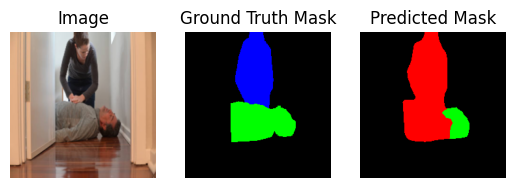

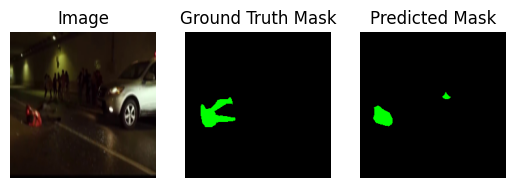

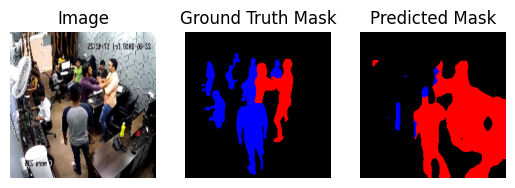

Epoch [5/50], Train Loss: 0.1488, Train Accuracy: 0.9479, Train IoU: 0.8462
Epoch [5/50], Valid Loss: 0.2255, Valid Accuracy: 0.9291, Valid IoU: 0.8429
Epoch [6/50], Step [100/101], Loss: 0.1618, Accuracy: 0.9403, IoU: 0.7956


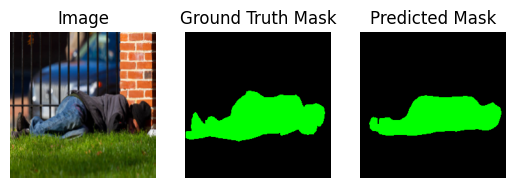

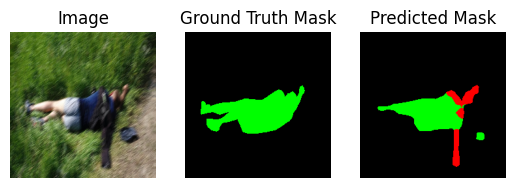

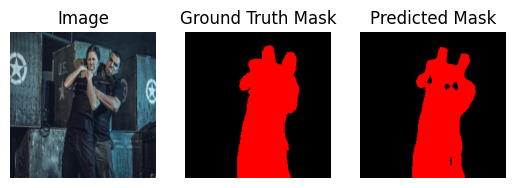

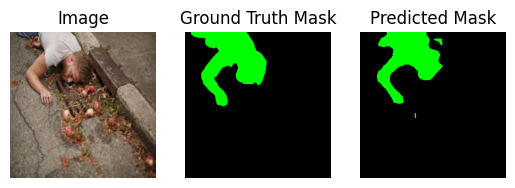

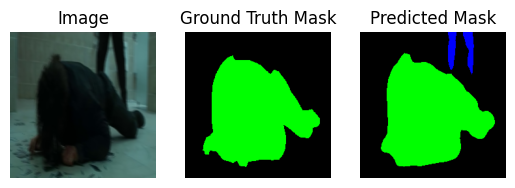

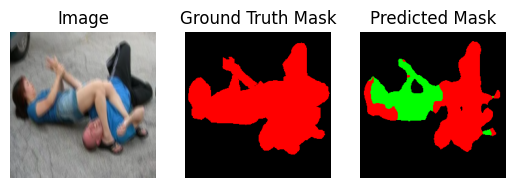

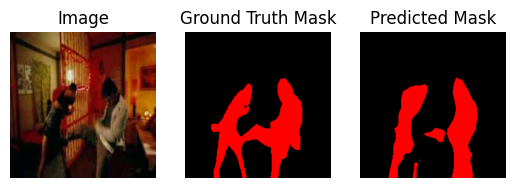

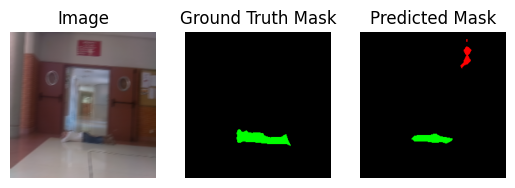

Epoch [6/50], Train Loss: 0.1443, Train Accuracy: 0.9497, Train IoU: 0.8460
Epoch [6/50], Valid Loss: 0.2154, Valid Accuracy: 0.9315, Valid IoU: 0.8271
Epoch [7/50], Step [100/101], Loss: 0.1366, Accuracy: 0.9540, IoU: 0.8623


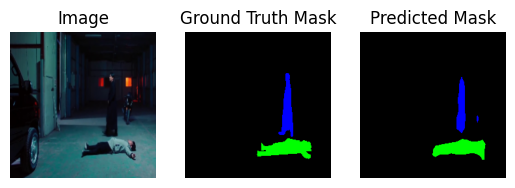

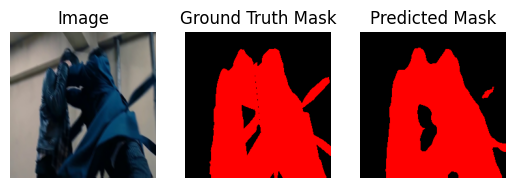

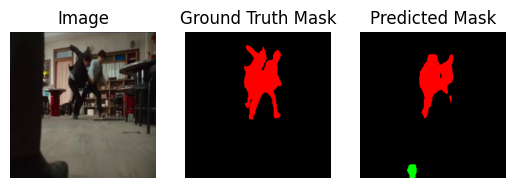

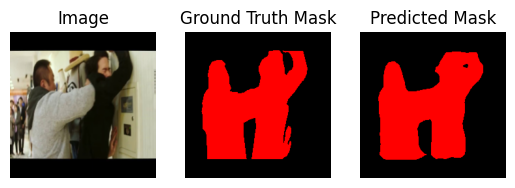

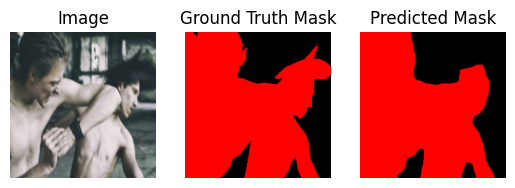

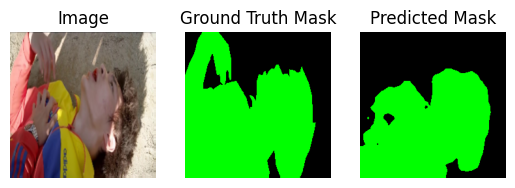

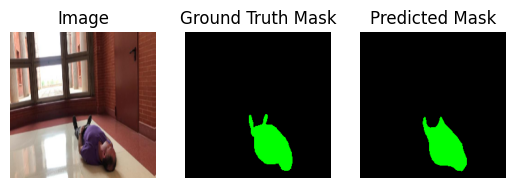

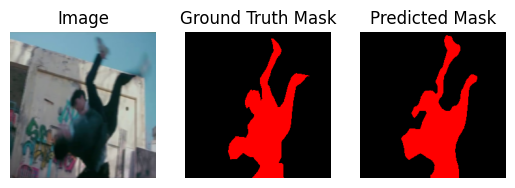

Epoch [7/50], Train Loss: 0.1437, Train Accuracy: 0.9510, Train IoU: 0.8551
Epoch [7/50], Valid Loss: 0.1853, Valid Accuracy: 0.9369, Valid IoU: 0.8524
Epoch [8/50], Step [100/101], Loss: 0.0879, Accuracy: 0.9679, IoU: 0.8383


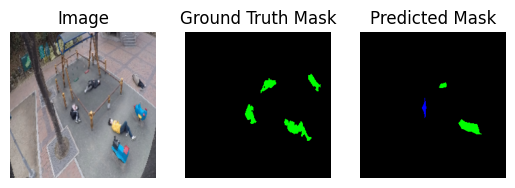

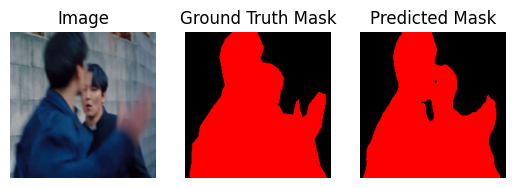

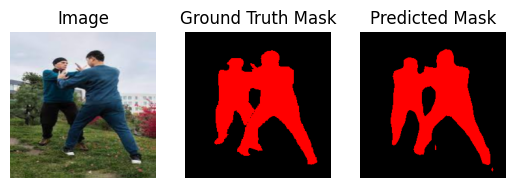

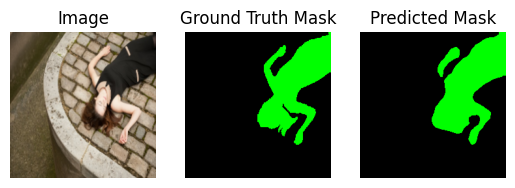

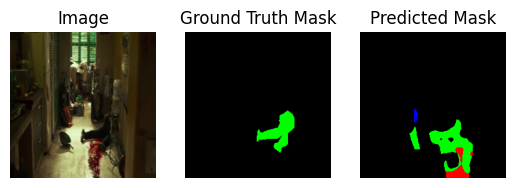

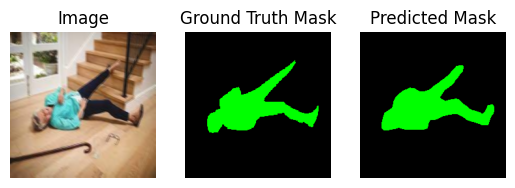

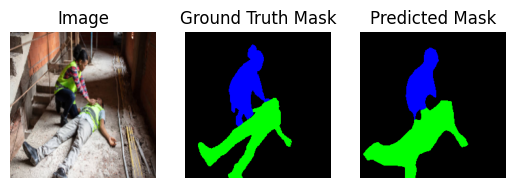

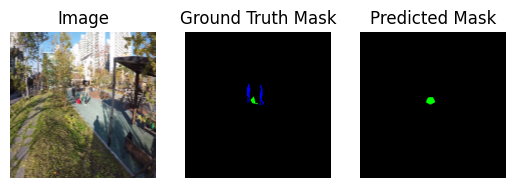

Epoch [8/50], Train Loss: 0.1182, Train Accuracy: 0.9576, Train IoU: 0.8668
Epoch [8/50], Valid Loss: 0.2051, Valid Accuracy: 0.9315, Valid IoU: 0.8369
Epoch [9/50], Step [100/101], Loss: 0.2399, Accuracy: 0.9280, IoU: 0.8130


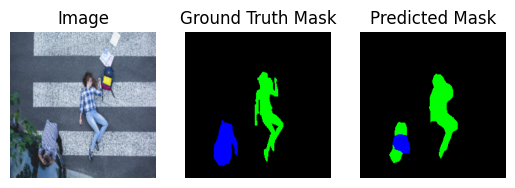

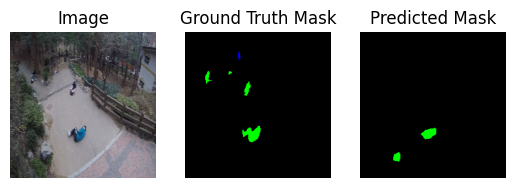

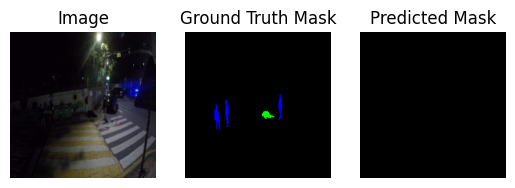

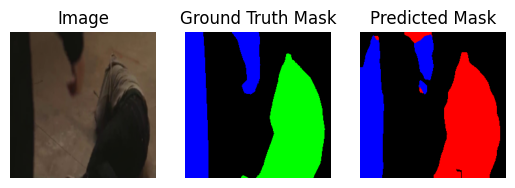

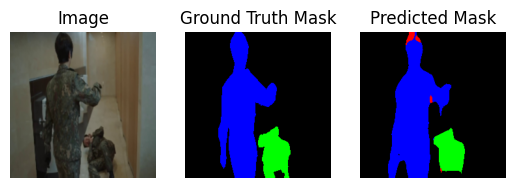

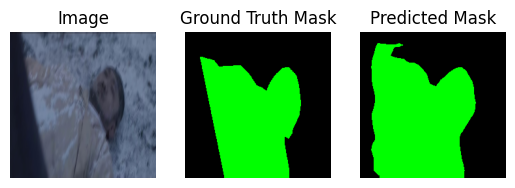

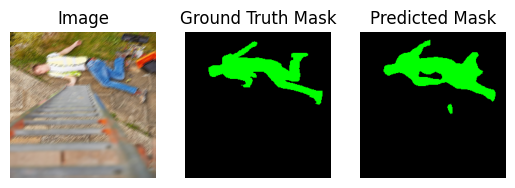

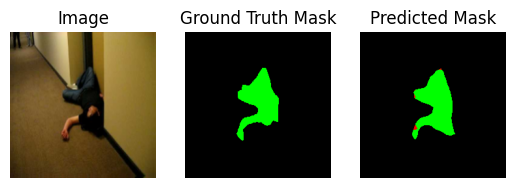

Epoch [9/50], Train Loss: 0.1295, Train Accuracy: 0.9553, Train IoU: 0.8700
Epoch [9/50], Valid Loss: 0.1975, Valid Accuracy: 0.9396, Valid IoU: 0.8402
Epoch [10/50], Step [100/101], Loss: 0.0967, Accuracy: 0.9633, IoU: 0.9013


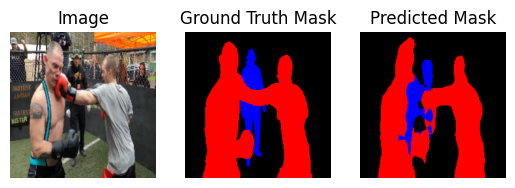

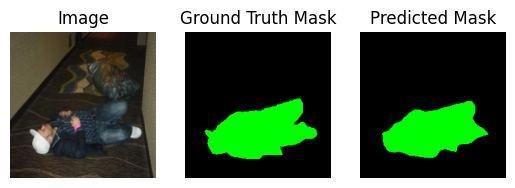

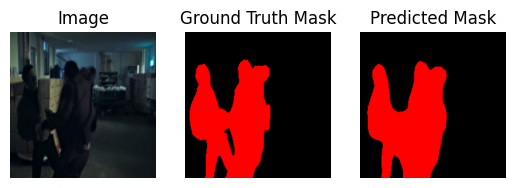

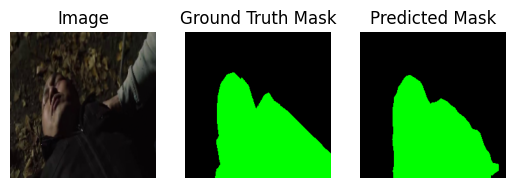

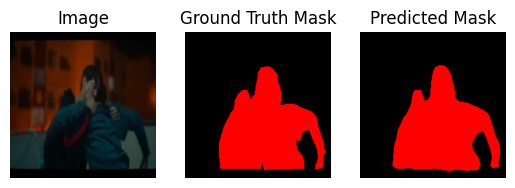

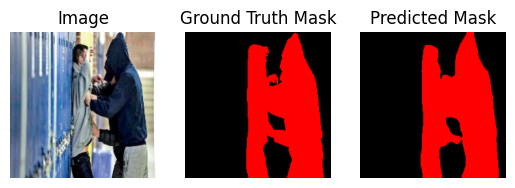

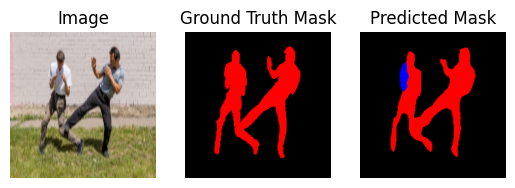

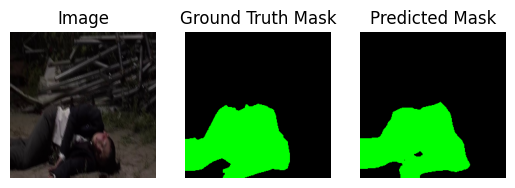

Epoch [10/50], Train Loss: 0.1173, Train Accuracy: 0.9582, Train IoU: 0.8659
Epoch [10/50], Valid Loss: 0.1545, Valid Accuracy: 0.9469, Valid IoU: 0.8525
Epoch [11/50], Step [100/101], Loss: 0.0755, Accuracy: 0.9732, IoU: 0.8785


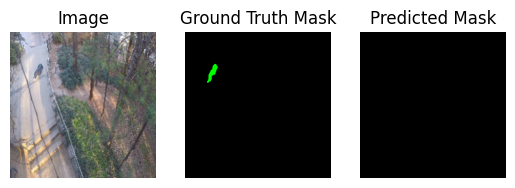

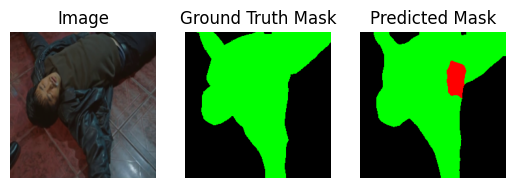

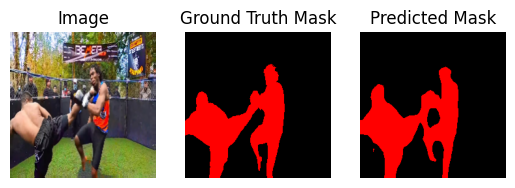

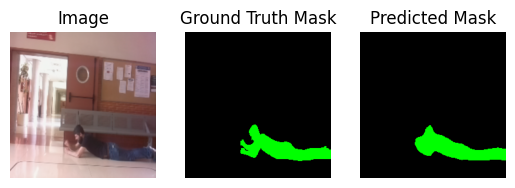

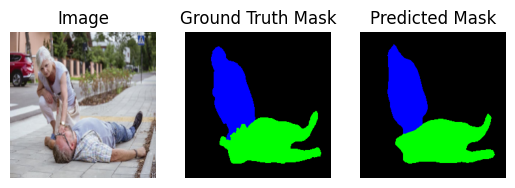

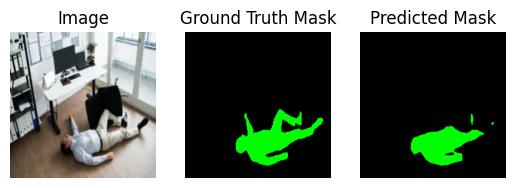

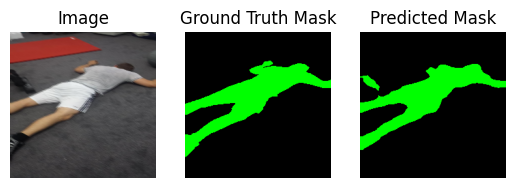

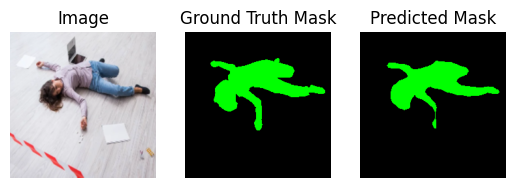

Epoch [11/50], Train Loss: 0.0966, Train Accuracy: 0.9646, Train IoU: 0.8822
Epoch [11/50], Valid Loss: 0.1707, Valid Accuracy: 0.9457, Valid IoU: 0.8520
Epoch [12/50], Step [100/101], Loss: 0.0863, Accuracy: 0.9656, IoU: 0.8858


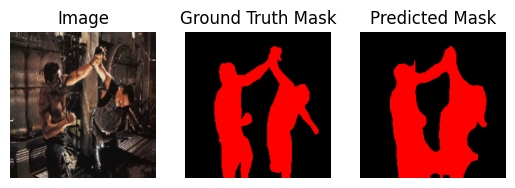

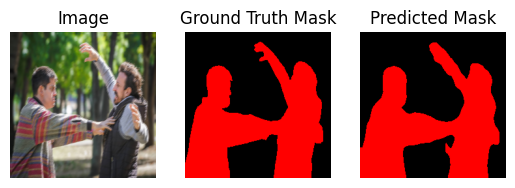

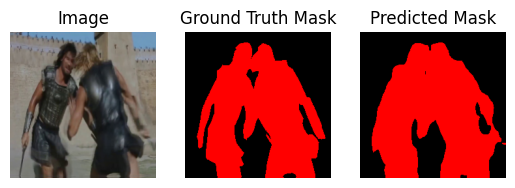

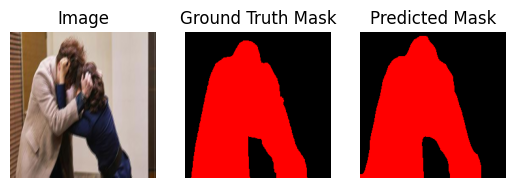

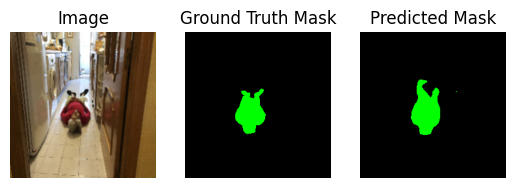

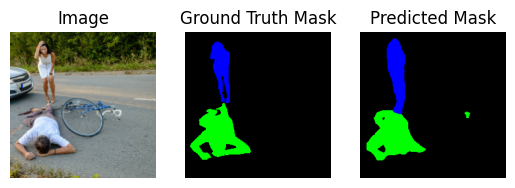

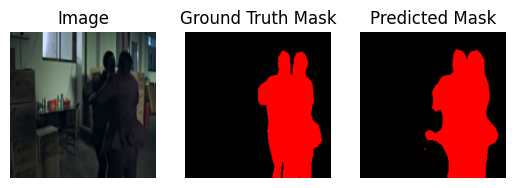

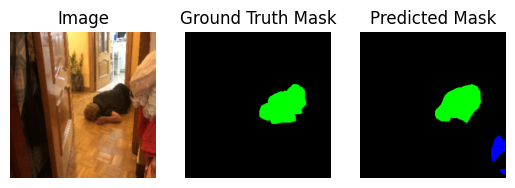

Epoch [12/50], Train Loss: 0.1068, Train Accuracy: 0.9616, Train IoU: 0.8838
Epoch [12/50], Valid Loss: 0.2754, Valid Accuracy: 0.9129, Valid IoU: 0.8235
Epoch [13/50], Step [100/101], Loss: 0.0791, Accuracy: 0.9708, IoU: 0.9039


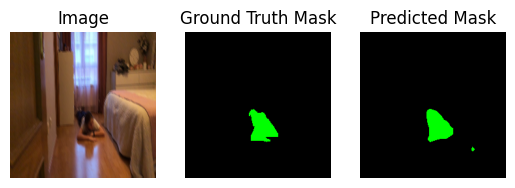

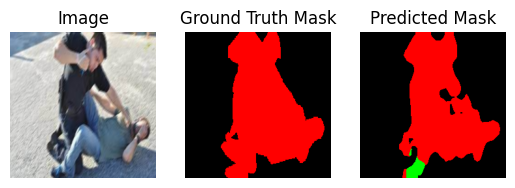

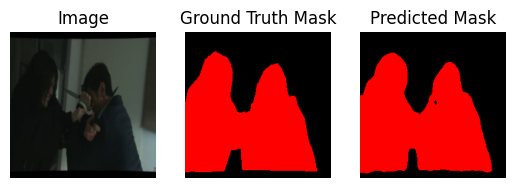

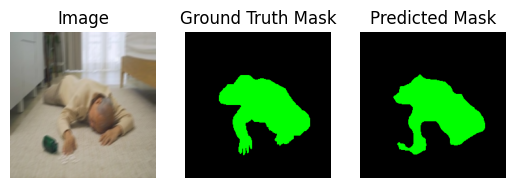

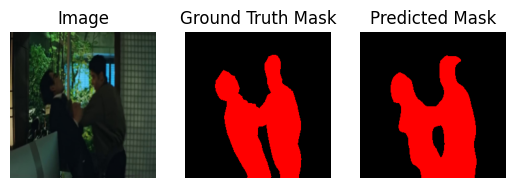

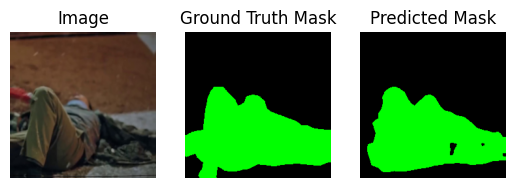

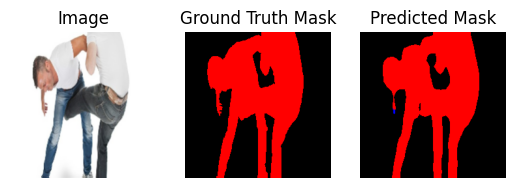

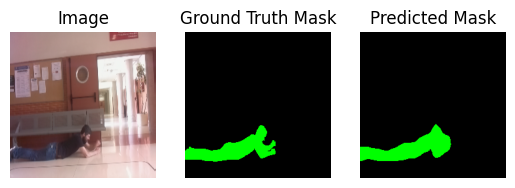

Epoch [13/50], Train Loss: 0.1147, Train Accuracy: 0.9575, Train IoU: 0.8628
Epoch [13/50], Valid Loss: 0.1774, Valid Accuracy: 0.9361, Valid IoU: 0.8440
Epoch [14/50], Step [100/101], Loss: 0.0779, Accuracy: 0.9696, IoU: 0.8546


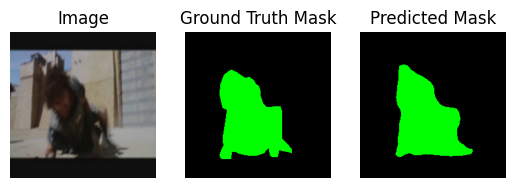

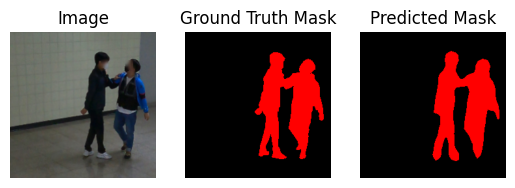

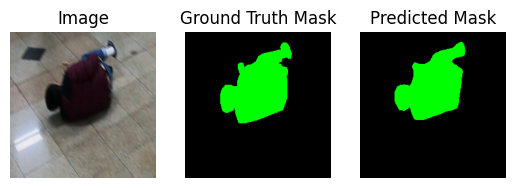

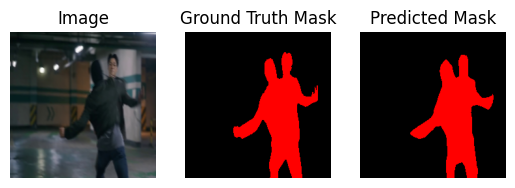

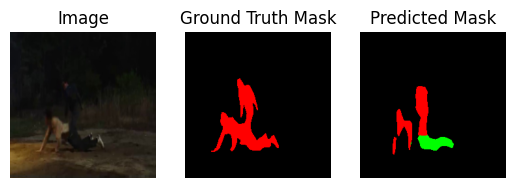

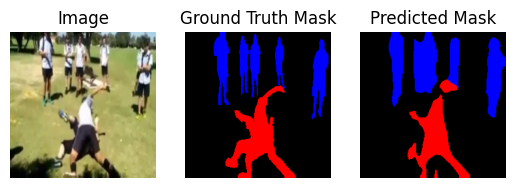

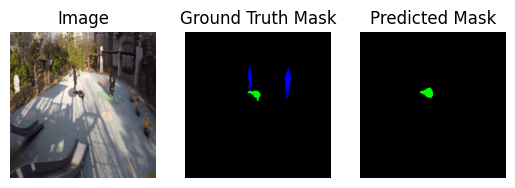

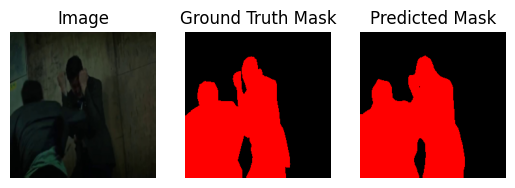

Epoch [14/50], Train Loss: 0.1041, Train Accuracy: 0.9614, Train IoU: 0.8794
Epoch [14/50], Valid Loss: 0.1599, Valid Accuracy: 0.9468, Valid IoU: 0.8449
Epoch [15/50], Step [100/101], Loss: 0.0702, Accuracy: 0.9715, IoU: 0.8629


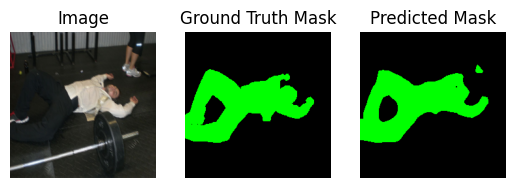

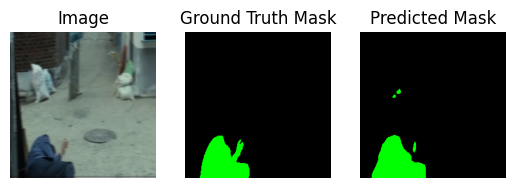

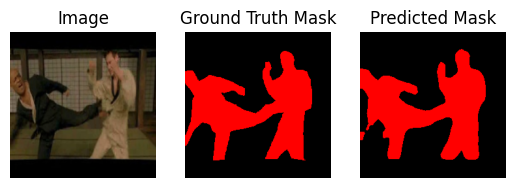

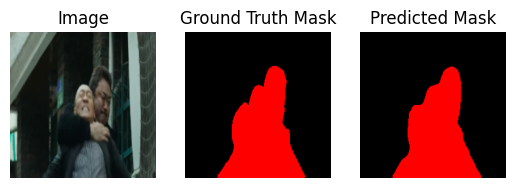

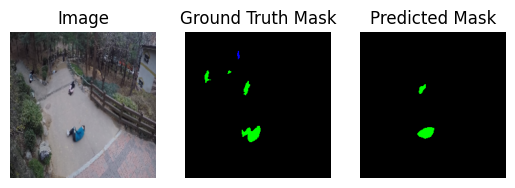

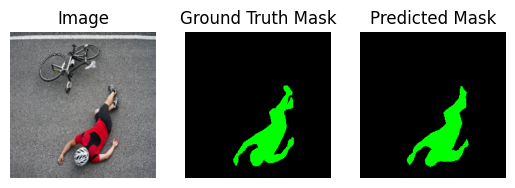

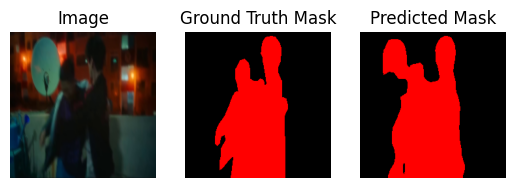

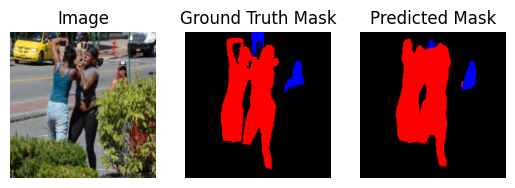

Epoch [15/50], Train Loss: 0.0866, Train Accuracy: 0.9671, Train IoU: 0.8908
Epoch [15/50], Valid Loss: 0.1656, Valid Accuracy: 0.9431, Valid IoU: 0.8545
Epoch [16/50], Step [100/101], Loss: 0.0546, Accuracy: 0.9794, IoU: 0.9314


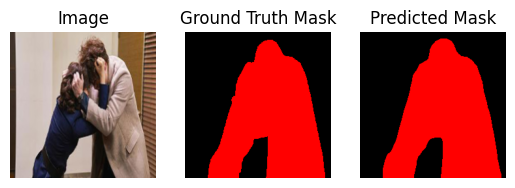

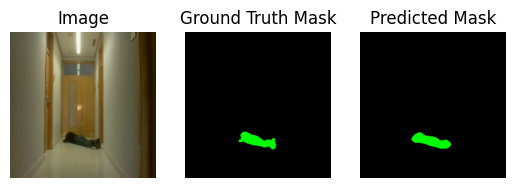

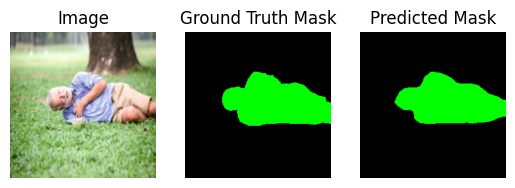

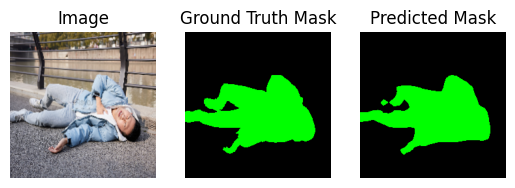

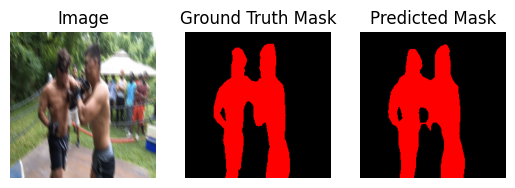

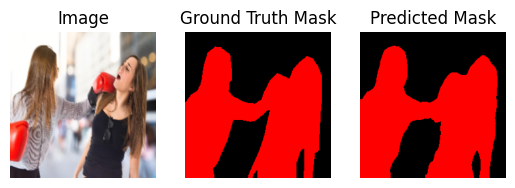

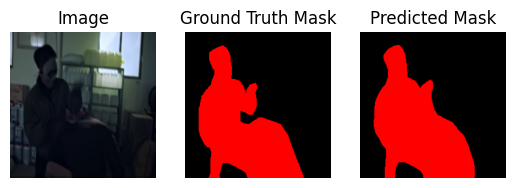

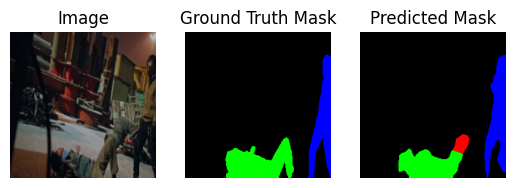

Epoch [16/50], Train Loss: 0.0811, Train Accuracy: 0.9694, Train IoU: 0.8942
Epoch [16/50], Valid Loss: 0.1666, Valid Accuracy: 0.9489, Valid IoU: 0.8631
Epoch [17/50], Step [100/101], Loss: 0.0838, Accuracy: 0.9660, IoU: 0.8954


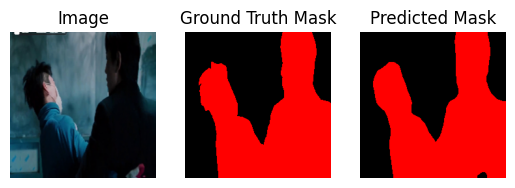

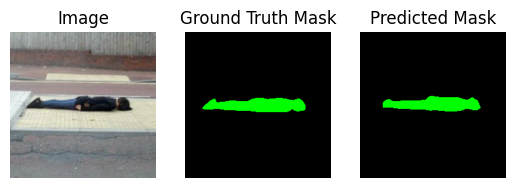

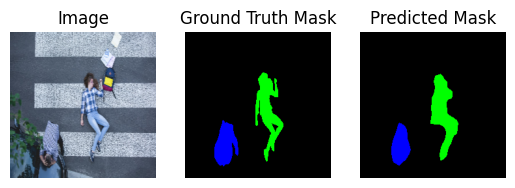

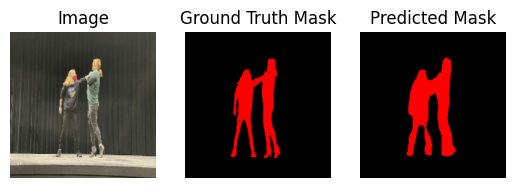

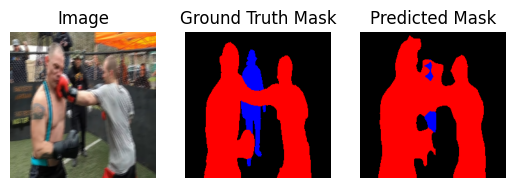

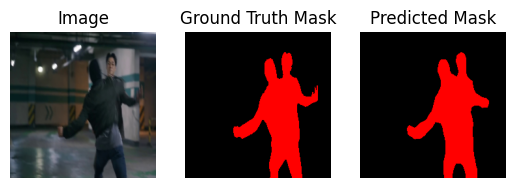

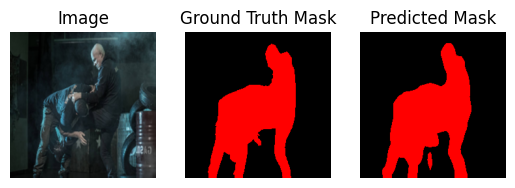

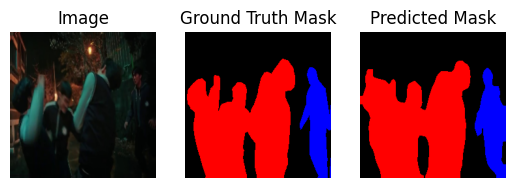

Epoch [17/50], Train Loss: 0.0693, Train Accuracy: 0.9731, Train IoU: 0.9069
Epoch [17/50], Valid Loss: 0.1665, Valid Accuracy: 0.9463, Valid IoU: 0.8600
Epoch [18/50], Step [100/101], Loss: 0.0604, Accuracy: 0.9762, IoU: 0.9287


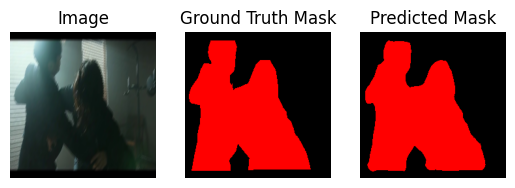

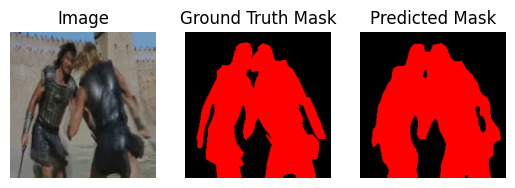

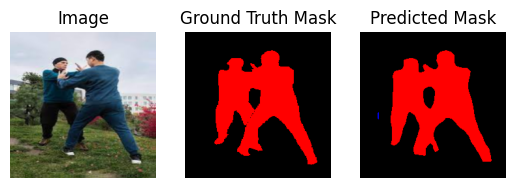

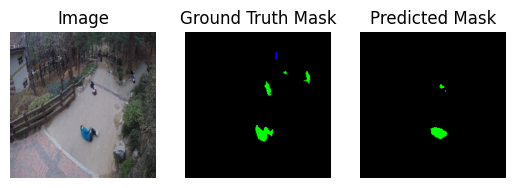

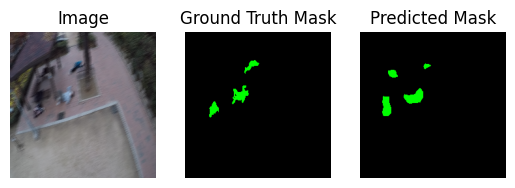

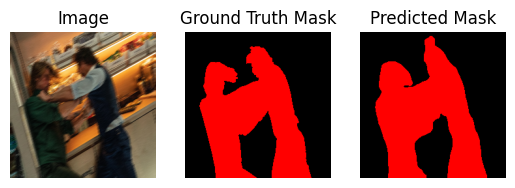

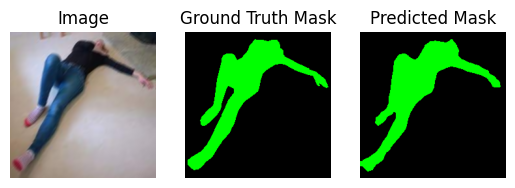

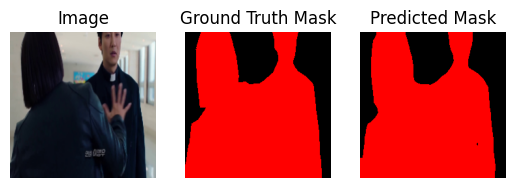

Epoch [18/50], Train Loss: 0.0698, Train Accuracy: 0.9728, Train IoU: 0.9045
Epoch [18/50], Valid Loss: 0.1633, Valid Accuracy: 0.9479, Valid IoU: 0.8575
Epoch [19/50], Step [100/101], Loss: 0.0663, Accuracy: 0.9727, IoU: 0.9197


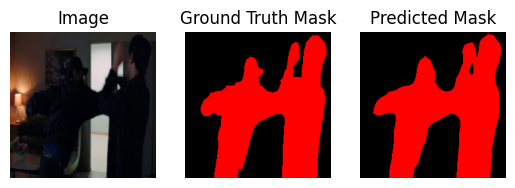

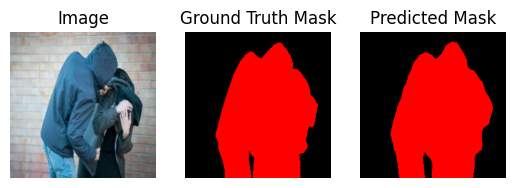

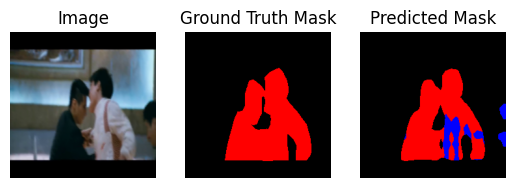

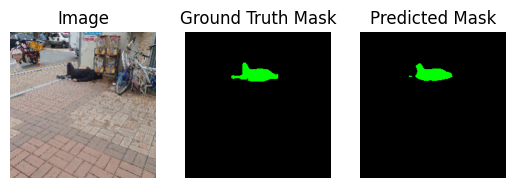

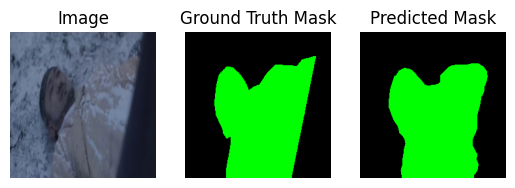

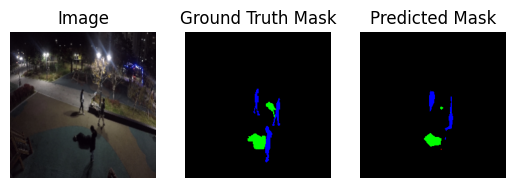

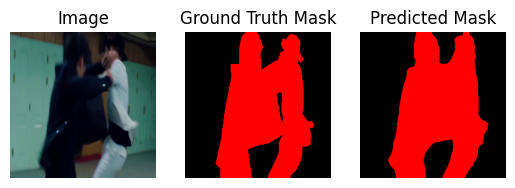

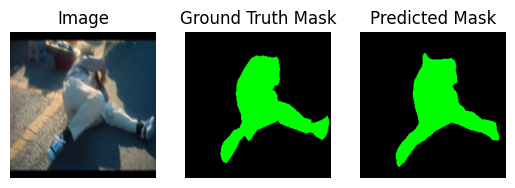

Epoch [19/50], Train Loss: 0.0717, Train Accuracy: 0.9725, Train IoU: 0.9070
Epoch [19/50], Valid Loss: 0.1534, Valid Accuracy: 0.9489, Valid IoU: 0.8655
Epoch [20/50], Step [100/101], Loss: 0.0568, Accuracy: 0.9775, IoU: 0.8894


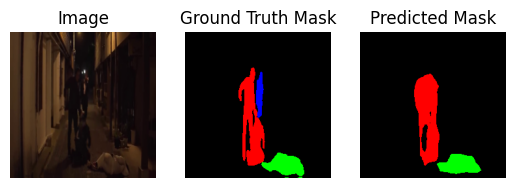

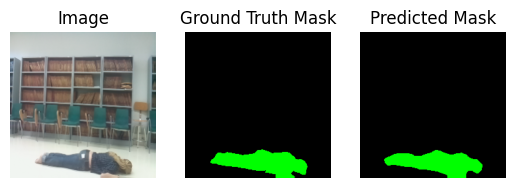

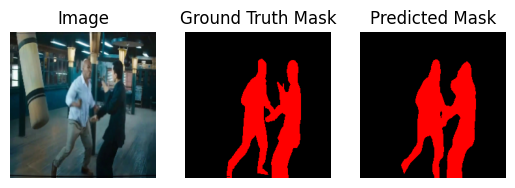

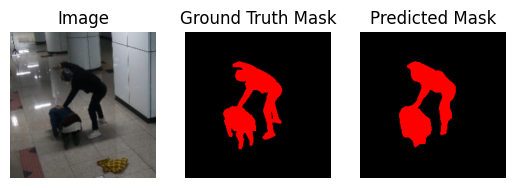

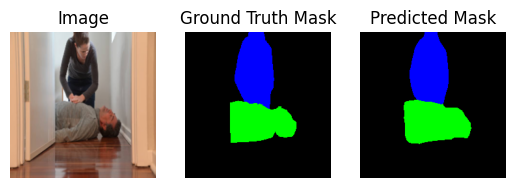

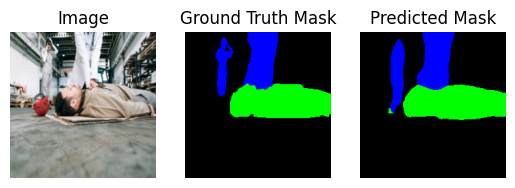

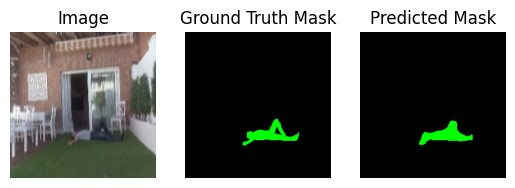

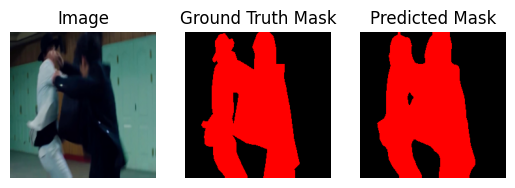

Epoch [20/50], Train Loss: 0.0666, Train Accuracy: 0.9740, Train IoU: 0.9090
Epoch [20/50], Valid Loss: 0.1665, Valid Accuracy: 0.9483, Valid IoU: 0.8550
Epoch [21/50], Step [100/101], Loss: 0.0484, Accuracy: 0.9801, IoU: 0.9118


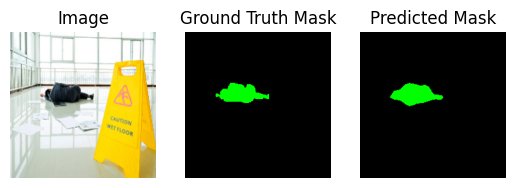

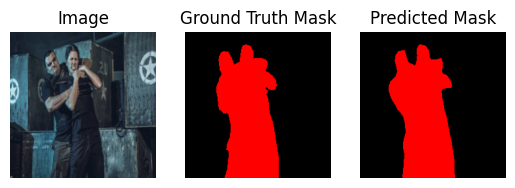

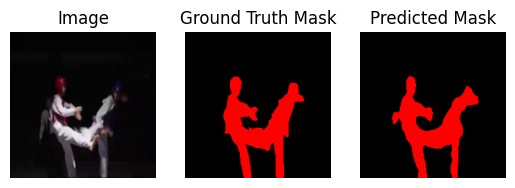

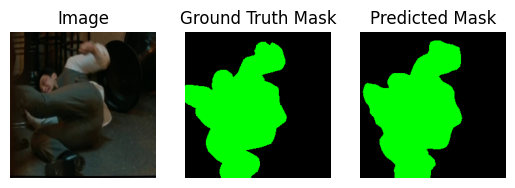

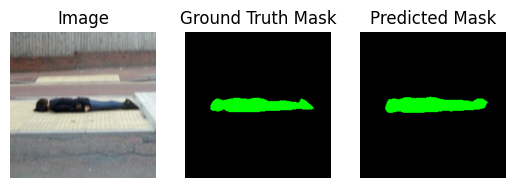

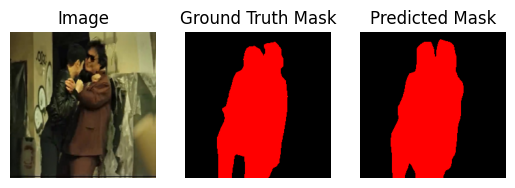

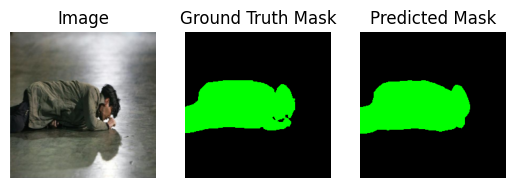

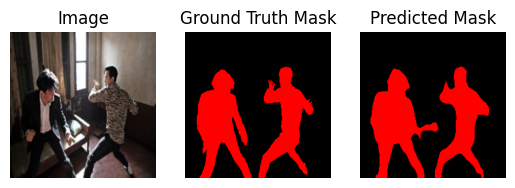

Epoch [21/50], Train Loss: 0.0679, Train Accuracy: 0.9733, Train IoU: 0.9089
Epoch [21/50], Valid Loss: 0.2060, Valid Accuracy: 0.9409, Valid IoU: 0.8583
Epoch [22/50], Step [100/101], Loss: 0.0615, Accuracy: 0.9757, IoU: 0.9038


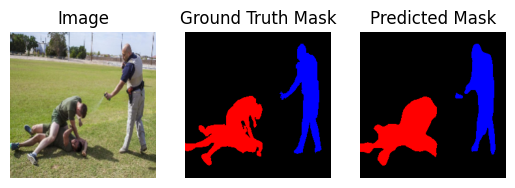

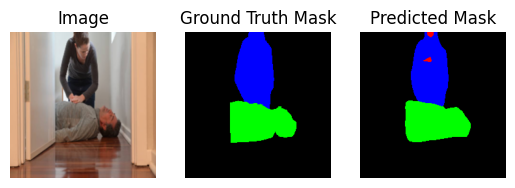

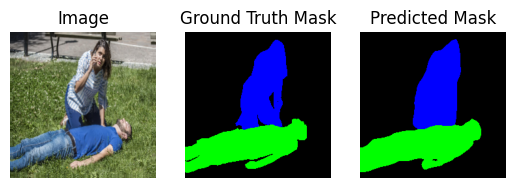

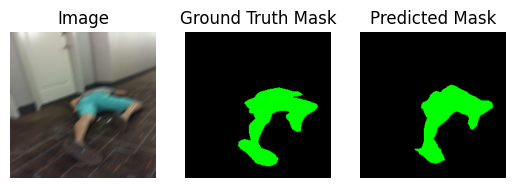

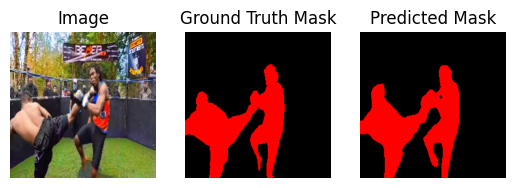

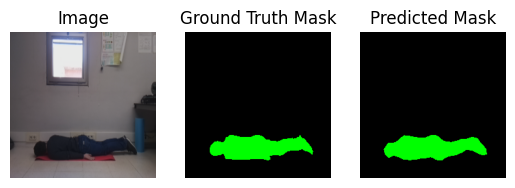

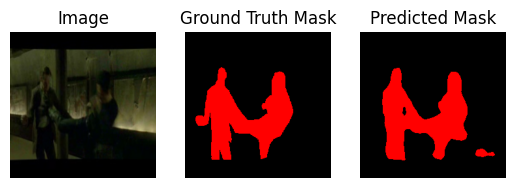

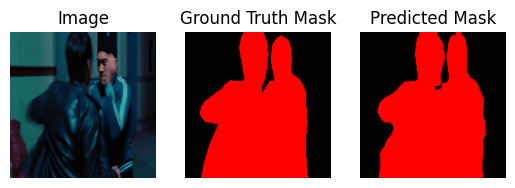

Epoch [22/50], Train Loss: 0.0653, Train Accuracy: 0.9745, Train IoU: 0.9112
Epoch [22/50], Valid Loss: 0.1608, Valid Accuracy: 0.9503, Valid IoU: 0.8665
Epoch [23/50], Step [100/101], Loss: 0.0715, Accuracy: 0.9708, IoU: 0.8782


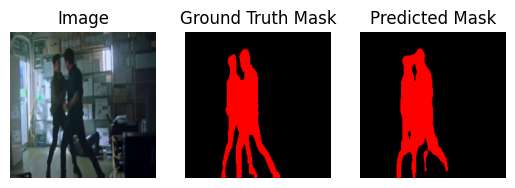

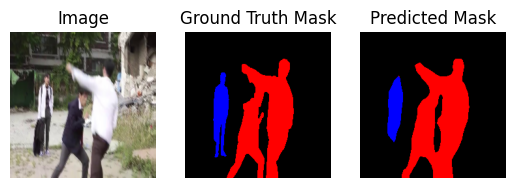

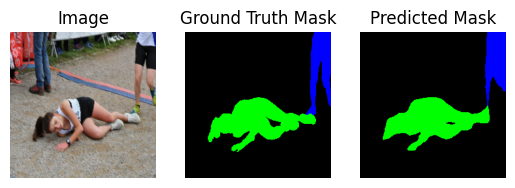

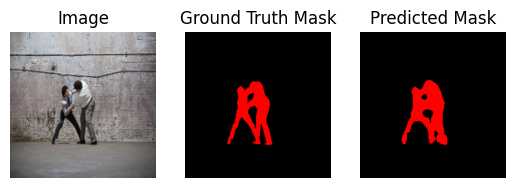

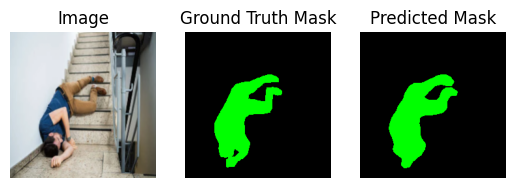

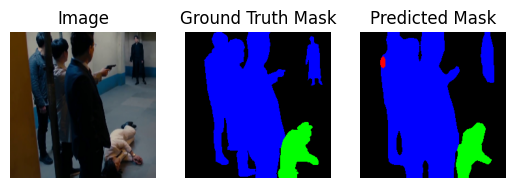

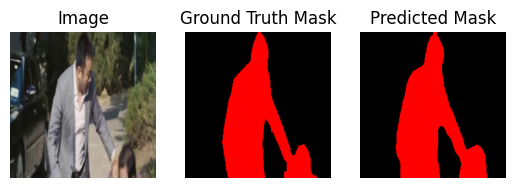

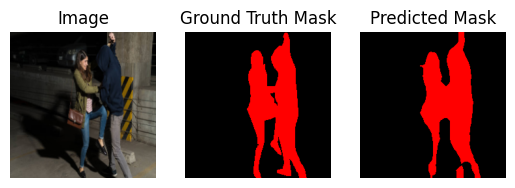

Epoch [23/50], Train Loss: 0.0626, Train Accuracy: 0.9752, Train IoU: 0.9120
Epoch [23/50], Valid Loss: 0.1777, Valid Accuracy: 0.9479, Valid IoU: 0.8556
Epoch [24/50], Step [100/101], Loss: 0.0453, Accuracy: 0.9827, IoU: 0.9337


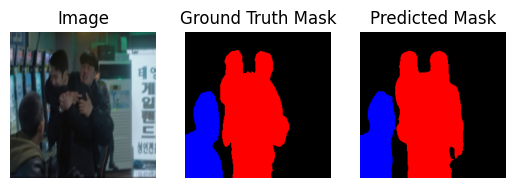

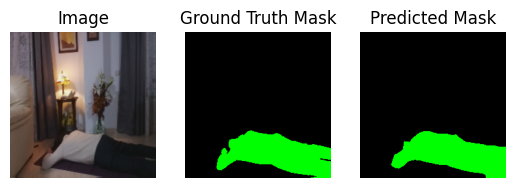

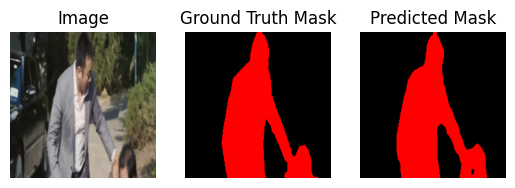

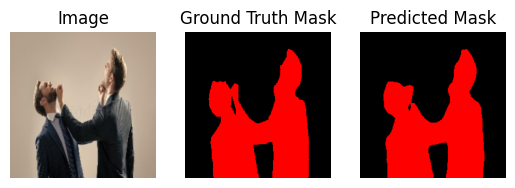

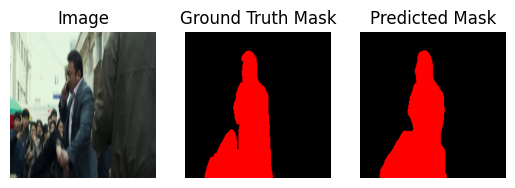

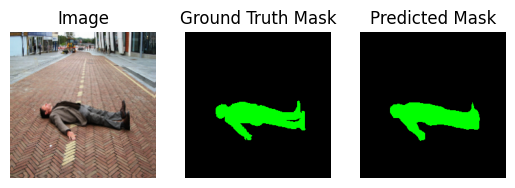

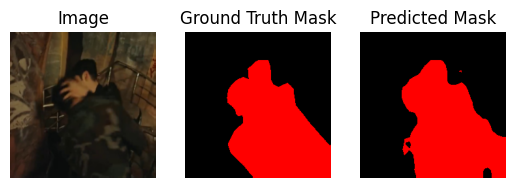

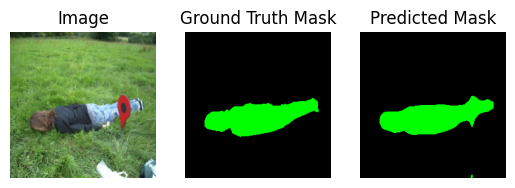

Epoch [24/50], Train Loss: 0.0587, Train Accuracy: 0.9765, Train IoU: 0.9160
Epoch [24/50], Valid Loss: 0.1646, Valid Accuracy: 0.9503, Valid IoU: 0.8617
Epoch [25/50], Step [100/101], Loss: 0.0518, Accuracy: 0.9786, IoU: 0.9281


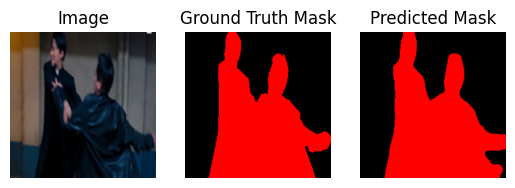

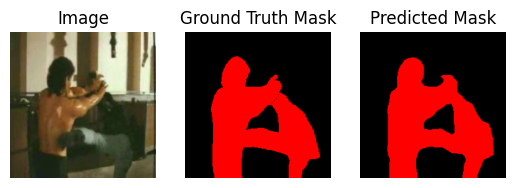

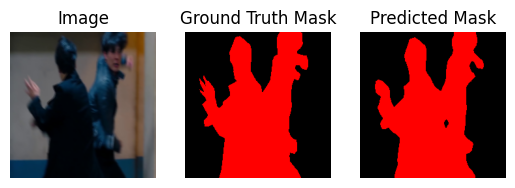

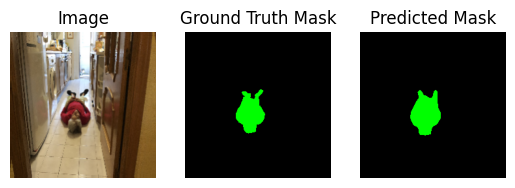

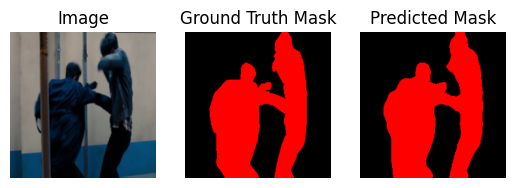

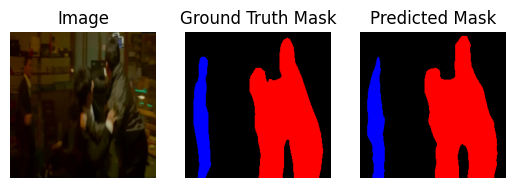

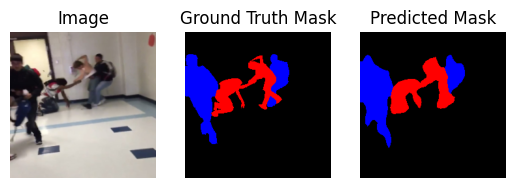

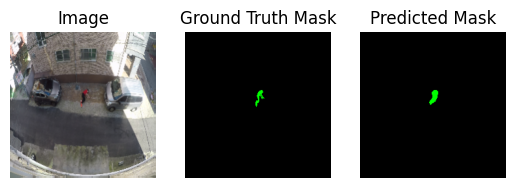

Epoch [25/50], Train Loss: 0.0562, Train Accuracy: 0.9776, Train IoU: 0.9189
Epoch [25/50], Valid Loss: 0.1717, Valid Accuracy: 0.9494, Valid IoU: 0.8645
Epoch [26/50], Step [100/101], Loss: 0.0722, Accuracy: 0.9725, IoU: 0.9221


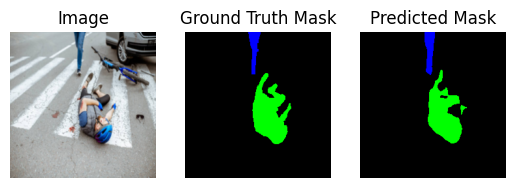

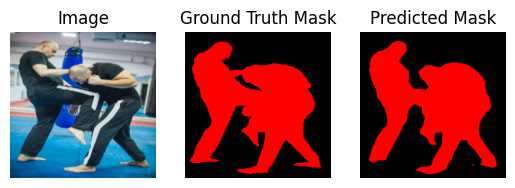

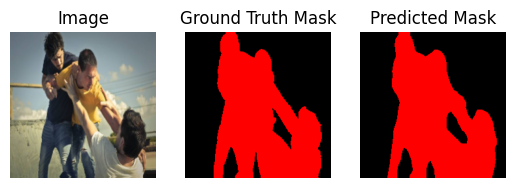

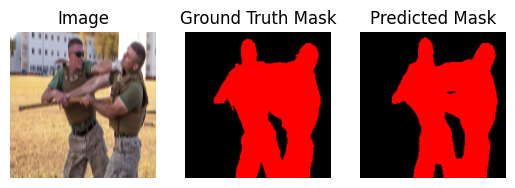

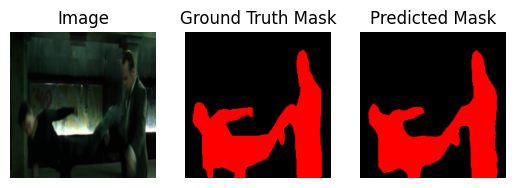

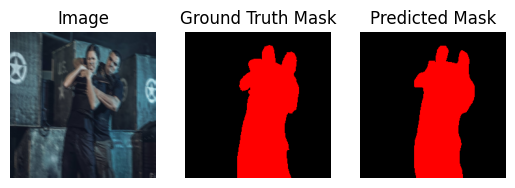

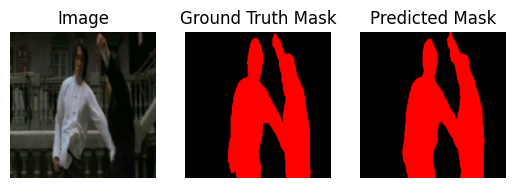

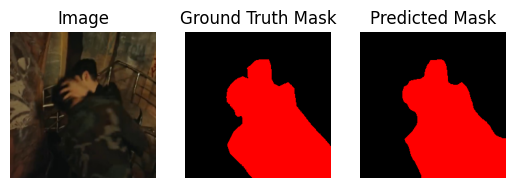

Epoch [26/50], Train Loss: 0.0544, Train Accuracy: 0.9782, Train IoU: 0.9206
Epoch [26/50], Valid Loss: 0.1726, Valid Accuracy: 0.9489, Valid IoU: 0.8571
Epoch [27/50], Step [100/101], Loss: 0.0834, Accuracy: 0.9699, IoU: 0.8719


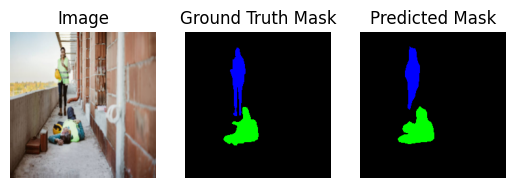

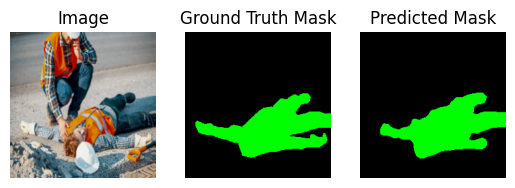

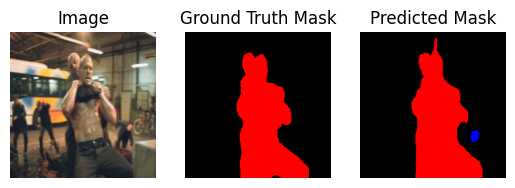

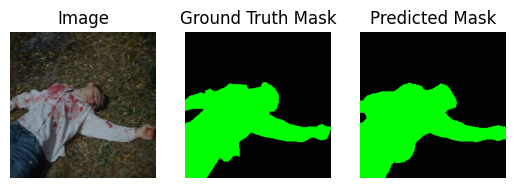

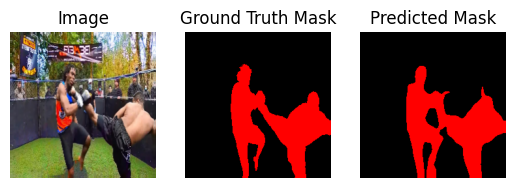

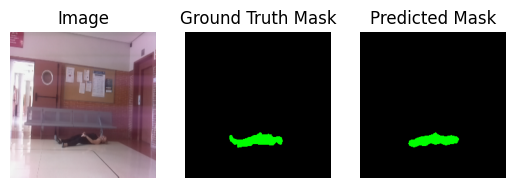

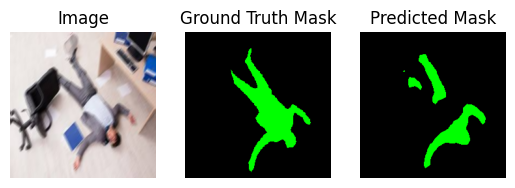

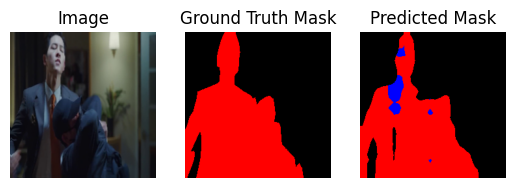

Epoch [27/50], Train Loss: 0.0850, Train Accuracy: 0.9699, Train IoU: 0.9094
Epoch [27/50], Valid Loss: 0.3576, Valid Accuracy: 0.8951, Valid IoU: 0.7983


KeyboardInterrupt: ignored

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

num_epochs = 50
print_interval = 100  # Print the outputs every 100 steps

epoch_losses = []
epoch_accuracies = []
epoch_ious = []
valid_losses = []
valid_accuracies = []
valid_ious = []

for epoch in range(num_epochs):

    model.train()  # Set the model to training mode
    batch_losses = []
    batch_accuracies = []
    batch_ious = []

    for step, (images, masks, _) in enumerate(train_loader):
        images = images.to(device)
        masks = masks.to(device)

        # Forward pass
        outputs = model(images)
        predicted_masks = outputs['out']
        loss = criterion(predicted_masks, masks.long())

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Accuracy & IoU
        accuracy = pixel_accuracy(predicted_masks, masks)
        iou_score = IoU(predicted_masks, masks)

        # Save loss, accuracy, and IoU for this batch
        batch_losses.append(loss.item())
        batch_accuracies.append(accuracy)
        batch_ious.append(iou_score.item())

        # Print the loss every few steps
        if (step + 1) % print_interval == 0:
            print(f'Epoch [{epoch + 1}/{num_epochs}], Step [{step + 1}/{len(train_loader)}], Loss: {loss.item():.4f}, Accuracy: {accuracy:.4f}, IoU: {iou_score:.4f}')

            # Visualize the images and masks
            images = images.cpu().numpy()
            masks = masks.cpu().numpy()
            predicted_masks = outputs['out'].argmax(dim=1)

            for i in range(len(images)):
                image = images[i]
                mask = masks[i]
                predicted_mask = predicted_masks[i]

                # Convert mask indices to colors for visualization
                mask_colors = [
                    [0, 0, 0],  # Background (black)
                    [255, 0, 0],  # Class 1 (red)
                    [0, 255, 0],  # Class 2 (green)
                    [0, 0, 255]
                    # Add more colors if there are more classes
                ]
                mask_rgb = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
                for idx, color in enumerate(mask_colors):
                    mask_rgb[mask == idx] = color

                predicted_mask_rgb = np.zeros((predicted_mask.shape[0], predicted_mask.shape[1], 3), dtype=np.uint8)
                for idx, color in enumerate(mask_colors):
                    predicted_mask_rgb[predicted_mask.cpu() == idx] = color

                # Display the images and masks
                plt.subplot(1, 3, 1)
                plt.imshow(image.transpose(1, 2, 0))
                plt.title('Image')
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.imshow(mask_rgb)
                plt.title('Ground Truth Mask')
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.imshow(predicted_mask_rgb)
                plt.title('Predicted Mask')
                plt.axis('off')

                plt.show()

    # Calculate average loss, accuracy, and IoU for this epoch
    epoch_losses.append(np.mean(batch_losses))
    epoch_accuracies.append(np.mean(batch_accuracies))
    epoch_ious.append(np.mean(batch_ious))

    # Validation phase
    model.eval()  # Set the model to evaluation mode
    valid_batch_losses = []
    valid_batch_accuracies = []
    valid_batch_ious = []
    with torch.no_grad():  # No need to calculate gradients
        for val_step, (val_images, val_masks, _) in enumerate(valid_loader):
            val_images = val_images.to(device)
            val_masks = val_masks.to(device)

            # Forward pass
            val_outputs = model(val_images)
            val_predicted_masks = val_outputs['out']
            val_loss = criterion(val_predicted_masks, val_masks.long())

            # Accuracy & IoU
            val_accuracy = pixel_accuracy(val_predicted_masks, val_masks)
            val_iou_score = IoU(val_predicted_masks, val_masks)

            # Save loss, accuracy, and IoU for this batch
            valid_batch_losses.append(val_loss.item())
            valid_batch_accuracies.append(val_accuracy)
            valid_batch_ious.append(val_iou_score.item())

        # Calculate average loss, accuracy, and IoU for validation set
        valid_losses.append(np.mean(valid_batch_losses))
        valid_accuracies.append(np.mean(valid_batch_accuracies))
        valid_ious.append(np.mean(valid_batch_ious))

    # Print average loss, accuracy, and IoU for this epoch
    print(f'Epoch [{epoch + 1}/{num_epochs}], Train Loss: {epoch_losses[-1]:.4f}, Train Accuracy: {epoch_accuracies[-1]:.4f}, Train IoU: {epoch_ious[-1]:.4f}')
    print(f'Epoch [{epoch + 1}/{num_epochs}], Valid Loss: {valid_losses[-1]:.4f}, Valid Accuracy: {valid_accuracies[-1]:.4f}, Valid IoU: {valid_ious[-1]:.4f}')

    if (epoch + 1) % 2 == 0:
        torch.save(model.state_dict(), "/content/drive/MyDrive/saved_model_epoch{}.pth".format(epoch + 1))

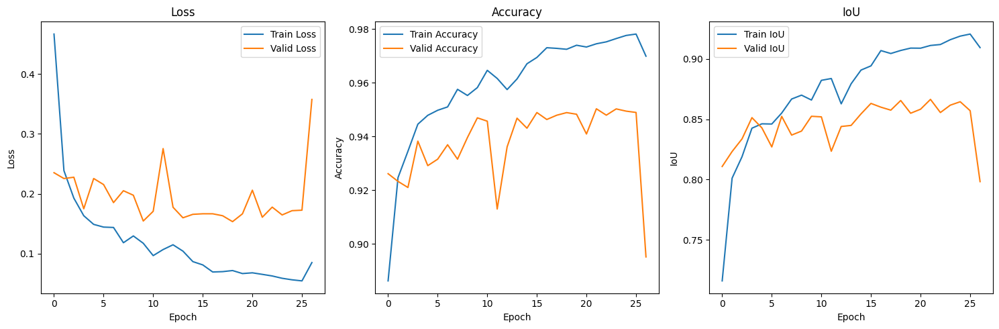

In [ ]:
# Plot the curves for loss, accuracy, and IoU
plt.figure(figsize=(15, 5))
# Plot Loss
plt.subplot(1, 3, 1)
plt.plot(epoch_losses, label='Train Loss')
plt.plot(valid_losses, label='Valid Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss')

# Plot Accuracy
plt.subplot(1, 3, 2)
plt.plot(epoch_accuracies, label='Train Accuracy')
plt.plot(valid_accuracies, label='Valid Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Accuracy')

# Plot IoU
plt.subplot(1, 3, 3)
plt.plot(epoch_ious, label='Train IoU')
plt.plot(valid_ious, label='Valid IoU')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()
plt.title('IoU')

plt.tight_layout()
plt.show()

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.9.0


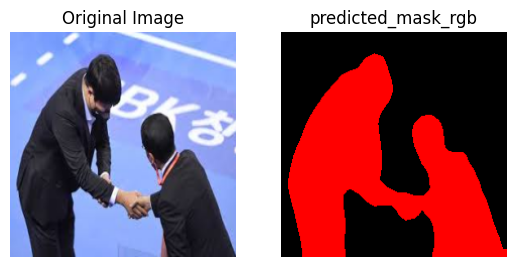

In [ ]:
model = torch.hub.load('pytorch/vision:v0.9.0', 'deeplabv3_resnet50', pretrained=False)
model.load_state_dict(torch.load('/content/drive/MyDrive/saved_model_epoch24.pth'), strict=False)
model.eval()  # Set the model to evaluation mode

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

image = cv2.imread('/content/악수.jpeg')  # Replace with the path to your image file
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = transform(image)
image = image.unsqueeze(0)  # Add batch dimension

with torch.no_grad():
    output = model(image)
    predicted_mask = torch.argmax(output['out'], dim=1).squeeze().cpu().numpy()

mask_colors = [
    [0, 0, 0],     # Background (black)
    [255, 0, 0],   # Fighting (red)
    [0, 255, 0],   # Falling (green)
    [0, 0, 255]
]

predicted_mask_rgb = np.zeros((predicted_mask.shape[0], predicted_mask.shape[1], 3), dtype=np.uint8)
for idx, color in enumerate(mask_colors):
    predicted_mask_rgb[predicted_mask == idx] = color

plt.subplot(1, 2, 1)
plt.imshow(image[0].cpu().numpy().transpose(1, 2, 0))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(predicted_mask_rgb)
plt.title('predicted_mask_rgb')
plt.axis('off')

plt.show()